<div align="center">
    <a href="https://www.visual-layer.com" target="_blank" rel="noopener noreferrer">
    <picture>
    <source media="(prefers-color-scheme: dark)" srcset="https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo_dark_mode.png" width=350>
    <source media="(prefers-color-scheme: light)" srcset="https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo.png" width=350>
    <img alt="vl logo." src="https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo.png">
    </picture>
    </a>
    <br>
    <br>
    <a href="https://visualdatabase.slack.com/join/shared_invite/zt-19jaydbjn-lNDEDkgvSI1QwbTXSY6dlA#/shared-invite/email" target="_blank" rel="noopener noreferrer">
    <img src="https://img.shields.io/badge/JOIN US ON SLACK-4A154B?style=for-the-badge&logo=slack&logoColor=white" alt="Logo">
    </a>
    <a href="https://visual-layer.readme.io/discuss" target="_blank" rel="noopener noreferrer">
    <img src="https://img.shields.io/badge/DISCUSSION%20FORUM-slateblue?style=for-the-badge&logo=discourse&logoWidth=20" alt="Logo">
    </a>
    <a href="https://www.linkedin.com/company/visual-layer/" target="_blank" rel="noopener noreferrer">
    <img src="https://img.shields.io/badge/LinkedIn-0077B5?style=for-the-badge&logo=linkedin&logoColor=white" alt="Logo">
    </a>
    <a href="https://twitter.com/visual_layer" target="_blank" rel="noopener noreferrer">
    <img src="https://img.shields.io/badge/Twitter-1DA1F2?style=for-the-badge&logo=twitter&logoColor=white" alt="Logo">
    </a>
    <a href="https://www.youtube.com/@visual-layer" target="_blank" rel="noopener noreferrer">
    <img src="https://img.shields.io/badge/-YouTube-black.svg?style=for-the-badge&logo=youtube&colorB=red" alt="Logo">
    </a>
</div>

# Enrich Your Dataset with Zero-Shot Models

[![Open in Colab](https://img.shields.io/badge/Open%20in%20Colab-blue?style=for-the-badge&logo=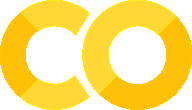&labelColor=gray)](https://colab.research.google.com/github/visual-layer/fastdup/blob/main/examples/enrichment-ram-groundingdino-sam.ipynb)
[![Kaggle](https://img.shields.io/badge/Open%20in%20Kaggle-blue?style=for-the-badge&logo=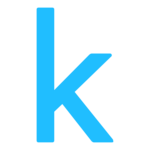&labelColor=gray)](https://kaggle.com/kernels/welcome?src=https://github.com/visual-layer/fastdup/blob/main/examples/enrichment-ram-groundingdino-sam.ipynb)
[![Explore the Docs](https://img.shields.io/badge/Explore%20the%20Docs-blue?style=for-the-badge&labelColor=gray&logo=read-the-docs)](https://visual-layer.readme.io/docs/enrichment-ram-groundingdino-sam)

In this notebook we show an end-to-end example on how you can enrich the metadata of your dataset using open-source zero-shot models such as [Recognize Anything](https://github.com/xinyu1205/recognize-anything), [Grounding DINO](https://github.com/IDEA-Research/GroundingDINO) and [Segment Anything](https://github.com/facebookresearch/segment-anything).

## Installation

First, let's install the neccessary packages:

- [fastdup](https://github.com/visual-layer/fastdup) - To analyze issues in the dataset.
- [Recognize Anything](https://github.com/xinyu1205/recognize-anything) - To use the RAM and Tag2Text model.
- [MMEngine](https://github.com/open-mmlab/mmengine), [MMDetection](https://github.com/open-mmlab/mmdetection), [groundingdino-py](https://github.com/IDEA-Research/GroundingDINO) - To use the Grounding DINO and MMDetection model.
- [Segment Anything Model](https://github.com/facebookresearch/segment-anything) - To use the SAM model.

In [ ]:
!pip install -Uq fastdup mmengine mmdet groundingdino-py git+https://github.com/dnth/recognize-anything.git git+https://github.com/facebookresearch/segment-anything.git gdown

Now, test the installation. If there's no error message, we are ready to go.

In [1]:
import fastdup
fastdup.__version__

'1.50'

## Download Dataset
Download the coco minitrain dataset.

In [ ]:
!gdown --fuzzy https://drive.google.com/file/d/1iSXVTlkV1_DhdYpVDqsjlT4NJFQ7OkyK/view
!unzip -qq coco_minitrain_25k.zip

## Load Images

In [2]:
import fastdup
import pandas as pd
from fastdup.utils import get_images_from_path

fd = fastdup.create(input_dir='./coco_minitrain_25k')
filenames = get_images_from_path(fd.input_dir)

df = pd.DataFrame(filenames, columns=["filename"])
df

,filename
0,coco_minitrain_25k/images/val2017/000000382734.jpg
1,coco_minitrain_25k/images/val2017/000000508730.jpg
2,coco_minitrain_25k/images/val2017/000000202339.jpg
3,coco_minitrain_25k/images/val2017/000000460929.jpg
4,coco_minitrain_25k/images/val2017/000000181796.jpg
...,...
35686,coco_minitrain_25k/fastdup_report_bbox/crops/imagestrain2017000000018687.jpg_225_344_266_414.jpg
35687,coco_minitrain_25k/fastdup_report_bbox/crops/imagestrain2017000000014159.jpg_97_146_145_310.jpg
35688,coco_minitrain_25k/fastdup_report_bbox/crops/imagestrain2017000000021595.jpg_553_166_640_289.jpg
35689,coco_minitrain_25k/fastdup_report_bbox/crops/imagestrain2017000000016403.jpg_72_170_101_213.jpg


## Zero-Shot Classification with RAM and Tag2Text

### Inference on a single image

In [3]:
from fastdup.models_ram import RecognizeAnythingModel

model = RecognizeAnythingModel()
result = model.run_inference("coco_minitrain_25k/images/val2017/000000382734.jpg")

INFO:fastdup.models.ram:Loading model checkpoint from - /home/dnth/ram_swin_large_14m.pth
INFO:fastdup.models.ram:Model loaded to device - cuda


In [4]:
result

'bath . bathroom . doorway . drain . floor . glass door . room . screen door . shower . white'

In [5]:
from fastdup.models_tag2text import Tag2TextModel
model = Tag2TextModel()
result = model.run_inference("coco_minitrain_25k/images/val2017/000000382734.jpg")

INFO:fastdup.model.tag2text:Loading model checkpoint from - /home/dnth/tag2text_swin_14m.pth
INFO:fastdup.model.tag2text:Model loaded to device - cuda


In [6]:
result

('room | floor | bathroom | shower | wall | toilet | green | white',
 None,
 'a bathroom with green walls and a white toilet')

### Inference on a DataFrame of images

Using Recognize Anything model outputs tags for each image.

In [7]:
df = fd.enrich(task='zero-shot-classification', model='recognize-anything-model', num_rows=10, device="cuda", input_df=df, input_col='filename')

INFO:fastdup.models.ram:Loading model checkpoint from - /home/dnth/ram_swin_large_14m.pth
INFO:fastdup.models.ram:Model loaded to device - cuda


In [8]:
df

,filename,ram_tags
0,coco_minitrain_25k/images/val2017/000000382734.jpg,bath . bathroom . doorway . drain . floor . glass door . room . screen door . shower . white
1,coco_minitrain_25k/images/val2017/000000508730.jpg,baby . bathroom . bathroom accessory . bin . boy . brush . chair . child . comb . diaper . hair . hairbrush . play . potty . sit . stool . tile wall . toddler . toilet bowl . toilet seat . toy
2,coco_minitrain_25k/images/val2017/000000202339.jpg,bus . bus station . business suit . carry . catch . city bus . pillar . man . shopping bag . sign . suit . tie . tour bus . walk
3,coco_minitrain_25k/images/val2017/000000460929.jpg,beer . beer bottle . beverage . blanket . bottle . roll . can . car . chili dog . condiment . table . dog . drink . foil . hot . hot dog . mustard . picnic table . sit . soda . tinfoil . tomato sauce . wrap
4,coco_minitrain_25k/images/val2017/000000181796.jpg,bean . cup . table . dinning table . plate . food . fork . fruit . wine . meal . meat . peak . platter . potato . silverware . utensil . vegetable . white . wine glass
5,coco_minitrain_25k/images/val2017/000000052565.jpg,beach . black . cattle . coast . cow . sea . photo . sand . shore . shoreline . stand . stare . water . white
6,coco_minitrain_25k/images/val2017/000000503755.jpg,catch . court . hand . goggles . necklace . play . racket . stand . sunglasses . tennis court . tennis player . tennis racket . wear . woman
7,coco_minitrain_25k/images/val2017/000000477955.jpg,attach . beach . catch . coast . fly . person . kite . man . sea . parachute . parasail . sand . sky . stand . string . surfboard . surfer . wetsuit
8,coco_minitrain_25k/images/val2017/000000562229.jpg,boy . child . ride . road . skateboard . skateboarder . stand . trick
9,coco_minitrain_25k/images/val2017/000000528862.jpg,animal . area . dirt field . enclosure . fence . field . giraffe . habitat . herd . lush . pen . savanna . stand . tree . walk . zoo


Using Tag2Text model outputs tags and captions.

In [9]:
df = fd.enrich(task='zero-shot-classification', model='tag2text', num_rows=10, device="cuda", input_df=df, input_col='filename')

INFO:fastdup.model.tag2text:Loading model checkpoint from - /home/dnth/tag2text_swin_14m.pth
INFO:fastdup.model.tag2text:Model loaded to device - cuda


In [10]:
df

,filename,ram_tags,tag2text_tags,tag2text_caption
0,coco_minitrain_25k/images/val2017/000000382734.jpg,bath . bathroom . doorway . drain . floor . glass door . room . screen door . shower . white,room . floor . bathroom . shower . wall . toilet . green . white,a bathroom with green walls and a white toilet
1,coco_minitrain_25k/images/val2017/000000508730.jpg,baby . bathroom . bathroom accessory . bin . boy . brush . chair . child . comb . diaper . hair . hairbrush . play . potty . sit . stool . tile wall . toddler . toilet bowl . toilet seat . toy,hair . bathroom . brush . girl . boy . child . toddler . kid . couple . toilet . sit . play . sit in . sit on . small . young . little,a couple of small kids sitting on a toilet in a bathroom with a little girl playing with her brush and hair
2,coco_minitrain_25k/images/val2017/000000202339.jpg,bus . bus station . business suit . carry . catch . city bus . pillar . man . shopping bag . sign . suit . tie . tour bus . walk,bag . bus . suit . luggage . man . hold . carry . walk,a man in a suit carrying a bag of luggage
3,coco_minitrain_25k/images/val2017/000000460929.jpg,beer . beer bottle . beverage . blanket . bottle . roll . can . car . chili dog . condiment . table . dog . drink . foil . hot . hot dog . mustard . picnic table . sit . soda . tinfoil . tomato sauce . wrap,bun . table . mustard . dog . beer . bottle . hotdog . sit . wrap . hot,a hot dog sitting on top of a bun wrapped in foil next to a bottle of beer
4,coco_minitrain_25k/images/val2017/000000181796.jpg,bean . cup . table . dinning table . plate . food . fork . fruit . wine . meal . meat . peak . platter . potato . silverware . utensil . vegetable . white . wine glass,meal . bean . table . wine . vegetable . meat . plate . food . wine glass . glass . sit on . wooden . white,a white plate of food sitting on a wooden table next to glasses of wine
5,coco_minitrain_25k/images/val2017/000000052565.jpg,beach . black . cattle . coast . cow . sea . photo . sand . shore . shoreline . stand . stare . water . white,ocean . body . cow . water . sand . beach . shore . stand . black . sandy,a black and white cow standing on a sandy shore near a body of water
6,coco_minitrain_25k/images/val2017/000000503755.jpg,catch . court . hand . goggles . necklace . play . racket . stand . sunglasses . tennis court . tennis player . tennis racket . wear . woman,tennis . tennis racquet . sunglass . hand . woman . ball . racket . racquet . tennis player . tennis court . court . tennis racket . play . hold . wear . stand . white . female,a woman in sunglasses playing tennis on a court with a tennis racket in her hand and a tennis racquet in her hand
7,coco_minitrain_25k/images/val2017/000000477955.jpg,attach . beach . catch . coast . fly . person . kite . man . sea . parachute . parasail . sand . sky . stand . string . surfboard . surfer . wetsuit,surfboard . ocean . board . water . kite . beach . person . man . hold . fly . stand,a man holding a surfboard standing on a beach with a kite flying above the water
8,coco_minitrain_25k/images/val2017/000000562229.jpg,boy . child . ride . road . skateboard . skateboarder . stand . trick,boy . child . parking lot . street . skateboard . helmet . kid . ride . skateboard . stand . small . young . little,a young boy in a helmet stands on a skateboard in a parking lot while a small child rides in the background
9,coco_minitrain_25k/images/val2017/000000528862.jpg,animal . area . dirt field . enclosure . fence . field . giraffe . habitat . herd . lush . pen . savanna . stand . tree . walk . zoo,enclosure . zoo . field . giraffe . herd . fence . grass . area . tree . animal . stand . grassy . many . several,several giraffes stand in a grassy area with many trees and other animals


## Zero-Shot Detection with Grounding DINO

### Inference on single image

Grounding DINO model expects an image and text prompt.

In [11]:
from fastdup.models_grounding_dino import GroundingDINO

model = GroundingDINO()
results = model.run_inference(image_path="coco_minitrain_25k/images/val2017/000000449996.jpg",
                    text_prompt="air field . airliner . plane . airport . airport runway . airport terminal . jet . land . park . raceway . sky . tarmac . terminal",
                    box_threshold=0.3,
                    text_threshold=0.25)

INFO:fastdup.models.grounding_dino:Loading model checkpoint from - /home/dnth/groundingdino_swint_ogc.pth


final text_encoder_type: bert-base-uncased


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
INFO:fastdup.models.grounding_dino:Model loaded on device - cuda


final text_encoder_type: bert-base-uncased


In [12]:
results

{'labels': ['sky',
  'airport terminal',
  'plane',
  'airliner',
  'jet',
  'jet',
  'tarmac'],
 'scores': [0.5286, 0.3451, 0.3822, 0.4872, 0.3853, 0.3502, 0.3026],
 'boxes': [(1.47, 1.45, 638.46, 241.37),
  (329.38, 291.55, 468.1, 319.69),
  (142.03, 247.3, 261.96, 296.55),
  (443.6, 111.93, 495.47, 130.84),
  (113.85, 290.28, 246.55, 340.23),
  (391.59, 271.73, 465.1, 295.48),
  (2.35, 277.69, 637.63, 425.32)]}

Outputs the columns grounding_dino bboxes, scores and labels.

In [13]:
df = fd.enrich(task='zero-shot-detection', model='grounding-dino', input_df=df, input_col='ram_tags', device="cuda")

INFO:fastdup.models.grounding_dino:Loading model checkpoint from - /home/dnth/groundingdino_swint_ogc.pth


final text_encoder_type: bert-base-uncased


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
INFO:fastdup.models.grounding_dino:Model loaded on device - cuda


final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased


In [14]:
df

,filename,ram_tags,tag2text_tags,tag2text_caption,grounding_dino_bboxes,grounding_dino_scores,grounding_dino_labels
0,coco_minitrain_25k/images/val2017/000000382734.jpg,bath . bathroom . doorway . drain . floor . glass door . room . screen door . shower . white,room . floor . bathroom . shower . wall . toilet . green . white,a bathroom with green walls and a white toilet,"[(94.36, 479.79, 236.6, 589.37), (4.92, 3.73, 475.19, 637.36), (95.94, 514.92, 376.53, 638.46), (41.91, 37.47, 425.01, 637.09), (115.27, 602.26, 164.17, 635.21)]","[0.5789, 0.3895, 0.4444, 0.3018, 0.3601]","[bath, bathroom, floor, glass door, drain]"
1,coco_minitrain_25k/images/val2017/000000508730.jpg,baby . bathroom . bathroom accessory . bin . boy . brush . chair . child . comb . diaper . hair . hairbrush . play . potty . sit . stool . tile wall . toddler . toilet bowl . toilet seat . toy,hair . bathroom . brush . girl . boy . child . toddler . kid . couple . toilet . sit . play . sit in . sit on . small . young . little,a couple of small kids sitting on a toilet in a bathroom with a little girl playing with her brush and hair,"[(3.58, 2.77, 635.13, 475.62), (30.91, 104.91, 301.75, 476.29), (68.59, 105.02, 266.22, 267.8), (359.26, 116.82, 576.6, 475.9), (374.37, 116.77, 557.19, 254.07), (466.9, 0.71, 638.7, 117.05), (266.95, 433.87, 291.04, 476.78), (466.53, 349.26, 525.87, 405.73), (350.62, 272.66, 571.98, 476.46)]","[0.5898, 0.3738, 0.3679, 0.3641, 0.362, 0.3482, 0.3804, 0.3755, 0.3742]","[bathroom, toddler, hair, toddler, hair, bathroom accessory, hairbrush, diaper, chair]"
2,coco_minitrain_25k/images/val2017/000000202339.jpg,bus . bus station . business suit . carry . catch . city bus . pillar . man . shopping bag . sign . suit . tie . tour bus . walk,bag . bus . suit . luggage . man . hold . carry . walk,a man in a suit carrying a bag of luggage,"[(73.28, 256.74, 135.63, 374.42), (103.53, 105.23, 267.7, 410.18), (98.31, 33.85, 271.8, 434.72), (203.78, 63.88, 463.32, 298.29), (147.5, 106.62, 163.49, 172.9), (164.1, 52.93, 272.88, 152.68), (0.49, 0.76, 82.86, 333.41), (1.96, 2.22, 477.75, 636.07), (398.15, 281.2, 479.01, 545.03), (147.02, 106.66, 163.66, 227.86)]","[0.605, 0.4599, 0.47, 0.4068, 0.3591, 0.4449, 0.4371, 0.3444, 0.3043, 0.4775]","[shopping bag, business suit, man, city bus, tie, sign, bus, bus station, carry, tie]"
3,coco_minitrain_25k/images/val2017/000000460929.jpg,beer . beer bottle . beverage . blanket . bottle . roll . can . car . chili dog . condiment . table . dog . drink . foil . hot . hot dog . mustard . picnic table . sit . soda . tinfoil . tomato sauce . wrap,bun . table . mustard . dog . beer . bottle . hotdog . sit . wrap . hot,a hot dog sitting on top of a bun wrapped in foil next to a bottle of beer,"[(288.11, 1.02, 423.49, 414.45), (178.93, 355.71, 327.01, 636.63), (214.56, 514.74, 280.53, 569.36), (234.05, 369.92, 286.25, 545.46), (1.41, 0.68, 478.3, 279.4), (5.18, 264.26, 476.49, 637.36), (170.14, 351.42, 356.79, 637.53), (18.26, 244.37, 415.31, 637.95), (211.98, 364.96, 287.86, 629.13), (295.23, 275.44, 399.61, 353.15), (1.46, 79.77, 477.84, 233.99)]","[0.5651, 0.3978, 0.3909, 0.3875, 0.3047, 0.3796, 0.4003, 0.3422, 0.4297, 0.3012, 0.3264]","[beer bottle, hot dog, mustard, tomato sauce, car, picnic table, hot dog, tinfoil, chili dog, condiment, car]"
4,coco_minitrain_25k/images/val2017/000000181796.jpg,bean . cup . table . dinning table . plate . food . fork . fruit . wine . meal . meat . peak . platter . potato . silverware . utensil . vegetable . white . wine glass,meal . bean . table . wine . vegetable . meat . plate . food . wine glass . glass . sit on . wooden . white,a white plate of food sitting on a wooden table next to glasses of wine,"[(105.15, 0.55, 239.98, 190.16), (214.13, 60.52, 298.47, 154.0), (163.61, 136.44, 501.68, 358.82), (495.3, 47.58, 553.6, 98.79), (520.29, 27.48, 564.41, 58.55), (402.73, 177.07, 594.84, 222.61), (136.47, 45.8, 226.12, 98.31), (478.39, 31.42, 524.07, 67.47), (349.11, 27.75, 610.1, 

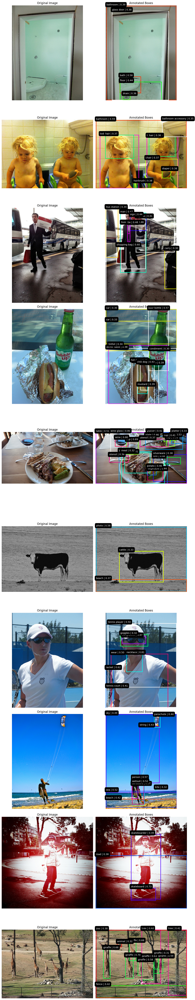

In [15]:
from fastdup.models_utils import plot_annotations
plot_annotations(df, image_col='filename', tags_col='ram_tags', bbox_col='grounding_dino_bboxes', scores_col='grounding_dino_scores', labels_col='grounding_dino_labels', num_rows=10)

### Custom Text Prompt

In [16]:
df_custom_prompt = df.copy()
df_custom_prompt["custom_prompt"] = "face . eye . hair . "

In [17]:
df_custom_prompt

,filename,ram_tags,tag2text_tags,tag2text_caption,grounding_dino_bboxes,grounding_dino_scores,grounding_dino_labels,custom_prompt
0,coco_minitrain_25k/images/val2017/000000382734.jpg,bath . bathroom . doorway . drain . floor . glass door . room . screen door . shower . white,room . floor . bathroom . shower . wall . toilet . green . white,a bathroom with green walls and a white toilet,"[(94.36, 479.79, 236.6, 589.37), (4.92, 3.73, 475.19, 637.36), (95.94, 514.92, 376.53, 638.46), (41.91, 37.47, 425.01, 637.09), (115.27, 602.26, 164.17, 635.21)]","[0.5789, 0.3895, 0.4444, 0.3018, 0.3601]","[bath, bathroom, floor, glass door, drain]",face . eye . hair .
1,coco_minitrain_25k/images/val2017/000000508730.jpg,baby . bathroom . bathroom accessory . bin . boy . brush . chair . child . comb . diaper . hair . hairbrush . play . potty . sit . stool . tile wall . toddler . toilet bowl . toilet seat . toy,hair . bathroom . brush . girl . boy . child . toddler . kid . couple . toilet . sit . play . sit in . sit on . small . young . little,a couple of small kids sitting on a toilet in a bathroom with a little girl playing with her brush and hair,"[(3.58, 2.77, 635.13, 475.62), (30.91, 104.91, 301.75, 476.29), (68.59, 105.02, 266.22, 267.8), (359.26, 116.82, 576.6, 475.9), (374.37, 116.77, 557.19, 254.07), (466.9, 0.71, 638.7, 117.05), (266.95, 433.87, 291.04, 476.78), (466.53, 349.26, 525.87, 405.73), (350.62, 272.66, 571.98, 476.46)]","[0.5898, 0.3738, 0.3679, 0.3641, 0.362, 0.3482, 0.3804, 0.3755, 0.3742]","[bathroom, toddler, hair, toddler, hair, bathroom accessory, hairbrush, diaper, chair]",face . eye . hair .
2,coco_minitrain_25k/images/val2017/000000202339.jpg,bus . bus station . business suit . carry . catch . city bus . pillar . man . shopping bag . sign . suit . tie . tour bus . walk,bag . bus . suit . luggage . man . hold . carry . walk,a man in a suit carrying a bag of luggage,"[(73.28, 256.74, 135.63, 374.42), (103.53, 105.23, 267.7, 410.18), (98.31, 33.85, 271.8, 434.72), (203.78, 63.88, 463.32, 298.29), (147.5, 106.62, 163.49, 172.9), (164.1, 52.93, 272.88, 152.68), (0.49, 0.76, 82.86, 333.41), (1.96, 2.22, 477.75, 636.07), (398.15, 281.2, 479.01, 545.03), (147.02, 106.66, 163.66, 227.86)]","[0.605, 0.4599, 0.47, 0.4068, 0.3591, 0.4449, 0.4371, 0.3444, 0.3043, 0.4775]","[shopping bag, business suit, man, city bus, tie, sign, bus, bus station, carry, tie]",face . eye . hair .
3,coco_minitrain_25k/images/val2017/000000460929.jpg,beer . beer bottle . beverage . blanket . bottle . roll . can . car . chili dog . condiment . table . dog . drink . foil . hot . hot dog . mustard . picnic table . sit . soda . tinfoil . tomato sauce . wrap,bun . table . mustard . dog . beer . bottle . hotdog . sit . wrap . hot,a hot dog sitting on top of a bun wrapped in foil next to a bottle of beer,"[(288.11, 1.02, 423.49, 414.45), (178.93, 355.71, 327.01, 636.63), (214.56, 514.74, 280.53, 569.36), (234.05, 369.92, 286.25, 545.46), (1.41, 0.68, 478.3, 279.4), (5.18, 264.26, 476.49, 637.36), (170.14, 351.42, 356.79, 637.53), (18.26, 244.37, 415.31, 637.95), (211.98, 364.96, 287.86, 629.13), (295.23, 275.44, 399.61, 353.15), (1.46, 79.77, 477.84, 233.99)]","[0.5651, 0.3978, 0.3909, 0.3875, 0.3047, 0.3796, 0.4003, 0.3422, 0.4297, 0.3012, 0.3264]","[beer bottle, hot dog, mustard, tomato sauce, car, picnic table, hot dog, tinfoil, chili dog, condiment, car]",face . eye . hair .
4,coco_minitrain_25k/images/val2017/000000181796.jpg,bean . cup . table . dinning table . plate . food . fork . fruit . wine . meal . meat . peak . platter . potato . silverware . utensil . vegetable . white . wine glass,meal . bean . table . wine . vegetable . meat . plate . food . wine glass . glass . sit on . wooden . white,a white plate of food sitting on a wooden table next to glasses of wine,"[(105.15, 0.55, 239.98, 190.16), (214.13, 60.52, 298.47, 154.0), (163.61, 136.44, 501.68, 358.82), (495.3, 47.58, 553.6, 98.79), (520.29, 27.48, 564.41, 58.55), (402.73, 177.07, 594.84, 2

In [18]:
df_custom_prompt = fd.enrich(task='zero-shot-detection', model='grounding-dino', input_df=df_custom_prompt, input_col='custom_prompt', device="cuda")
df_custom_prompt

INFO:fastdup.models.grounding_dino:Loading model checkpoint from - /home/dnth/groundingdino_swint_ogc.pth


final text_encoder_type: bert-base-uncased


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
INFO:fastdup.models.grounding_dino:Model loaded on device - cuda


final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased
final text_encoder_type: bert-base-uncased


,filename,ram_tags,tag2text_tags,tag2text_caption,grounding_dino_bboxes,grounding_dino_scores,grounding_dino_labels,custom_prompt
0,coco_minitrain_25k/images/val2017/000000382734.jpg,bath . bathroom . doorway . drain . floor . glass door . room . screen door . shower . white,room . floor . bathroom . shower . wall . toilet . green . white,a bathroom with green walls and a white toilet,[],[],[],face . eye . hair .
1,coco_minitrain_25k/images/val2017/000000508730.jpg,baby . bathroom . bathroom accessory . bin . boy . brush . chair . child . comb . diaper . hair . hairbrush . play . potty . sit . stool . tile wall . toddler . toilet bowl . toilet seat . toy,hair . bathroom . brush . girl . boy . child . toddler . kid . couple . toilet . sit . play . sit in . sit on . small . young . little,a couple of small kids sitting on a toilet in a bathroom with a little girl playing with her brush and hair,"[(111.61, 183.91, 211.03, 300.08), (373.03, 117.48, 557.48, 255.6), (429.51, 205.87, 512.15, 275.5), (68.17, 105.78, 267.42, 265.82), (167.08, 234.47, 190.86, 247.08), (486.49, 222.14, 503.53, 232.73), (121.71, 238.59, 144.87, 249.47), (449.39, 223.3, 466.83, 232.74)]","[0.5332, 0.5661, 0.4495, 0.5786, 0.3995, 0.3641, 0.397, 0.3431]","[face, hair, face, hair, eye, eye, eye, eye]",face . eye . hair .
2,coco_minitrain_25k/images/val2017/000000202339.jpg,bus . bus station . business suit . carry . catch . city bus . pillar . man . shopping bag . sign . suit . tie . tour bus . walk,bag . bus . suit . luggage . man . hold . carry . walk,a man in a suit carrying a bag of luggage,"[(135.15, 44.15, 172.74, 96.72), (133.59, 34.84, 179.46, 67.8), (153.42, 59.65, 163.44, 66.16)]","[0.5035, 0.3673, 0.3156]","[face, hair, eye]",face . eye . hair .
3,coco_minitrain_25k/images/val2017/000000460929.jpg,beer . beer bottle . beverage . blanket . bottle . roll . can . car . chili dog . condiment . table . dog . drink . foil . hot . hot dog . mustard . picnic table . sit . soda . tinfoil . tomato sauce . wrap,bun . table . mustard . dog . beer . bottle . hotdog . sit . wrap . hot,a hot dog sitting on top of a bun wrapped in foil next to a bottle of beer,[],[],[],face . eye . hair .
4,coco_minitrain_25k/images/val2017/000000181796.jpg,bean . cup . table . dinning table . plate . food . fork . fruit . wine . meal . meat . peak . platter . potato . silverware . utensil . vegetable . white . wine glass,meal . bean . table . wine . vegetable . meat . plate . food . wine glass . glass . sit on . wooden . white,a white plate of food sitting on a wooden table next to glasses of wine,[],[],[],face . eye . hair .
5,coco_minitrain_25k/images/val2017/000000052565.jpg,beach . black . cattle . coast . cow . sea . photo . sand . shore . shoreline . stand . stare . water . white,ocean . body . cow . water . sand . beach . shore . stand . black . sandy,a black and white cow standing on a sandy shore near a body of water,"[(197.29, 193.85, 237.18, 263.0), (229.53, 214.17, 237.03, 223.19), (197.72, 213.68, 204.14, 222.31)]","[0.5046, 0.3701, 0.3383]","[face, eye, eye]",face . eye . hair .
6,coco_minitrain_25k/images/val2017/000000503755.jpg,catch . court . hand . goggles . necklace . play . racket . stand . sunglasses . tennis court . tennis player . tennis racket . wear . woman,tennis . tennis racquet . sunglass . hand . woman . ball . racket . racquet . tennis player . tennis court . court . tennis racket . play . hold . wear . stand . white . female,a woman in sunglasses playing tennis on a court with a tennis racket in her hand and a tennis racquet in her hand,"[(121.77, 138.54, 265.7, 292.26)]",[0.6137],[face],face . eye . hair .
7,coco_minitrain_25k/images/val2017/000000477955.jpg,attach . beach . catch . coast . fly . person . kite . man . sea . parachute . parasail . sand . sky . stand . string . surfboard . surfer . wetsuit,surfboard . ocean . board . water . kite . beach . person . man . hold . fly . stand,a man holding a surfboard standing on a beach with a kite fl

Remove rows with empty detection.

In [19]:
df_custom_prompt = df_custom_prompt[df_custom_prompt['grounding_dino_labels'].astype(bool)]

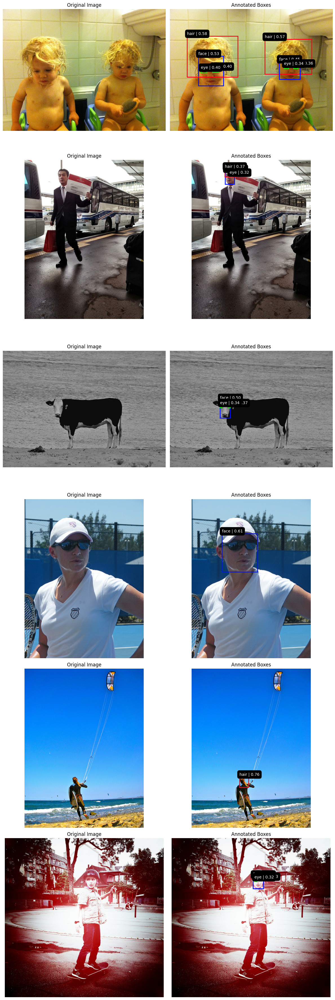

In [20]:
plot_annotations(df_custom_prompt, image_col='filename', tags_col='custom_prompt', bbox_col='grounding_dino_bboxes', scores_col='grounding_dino_scores', labels_col='grounding_dino_labels', num_rows=10)

## Zero-Shot Segmentation with SAM

For single image and single bounding box.

In [21]:
from fastdup.models_sam import SegmentAnythingModel
import torch

model = SegmentAnythingModel()
result = model.run_inference(image_path="coco_minitrain_25k/images/val2017/000000449996.jpg", bboxes=torch.tensor((1.47, 1.45, 638.46, 241.37)))

INFO:fastdup.model.sam:Loading model checkpoint from - /home/dnth/sam_vit_h_4b8939.pth


For multiple images and multiple bounding boxes in a DataFrame.

In [22]:
df = fd.enrich(task='zero-shot-segmentation', model='segment-anything', input_df=df, input_col='grounding_dino_bboxes')

INFO:fastdup.model.sam:Loading model checkpoint from - /home/dnth/sam_vit_h_4b8939.pth


In [23]:
df.dropna(subset=['sam_masks'], inplace=True)

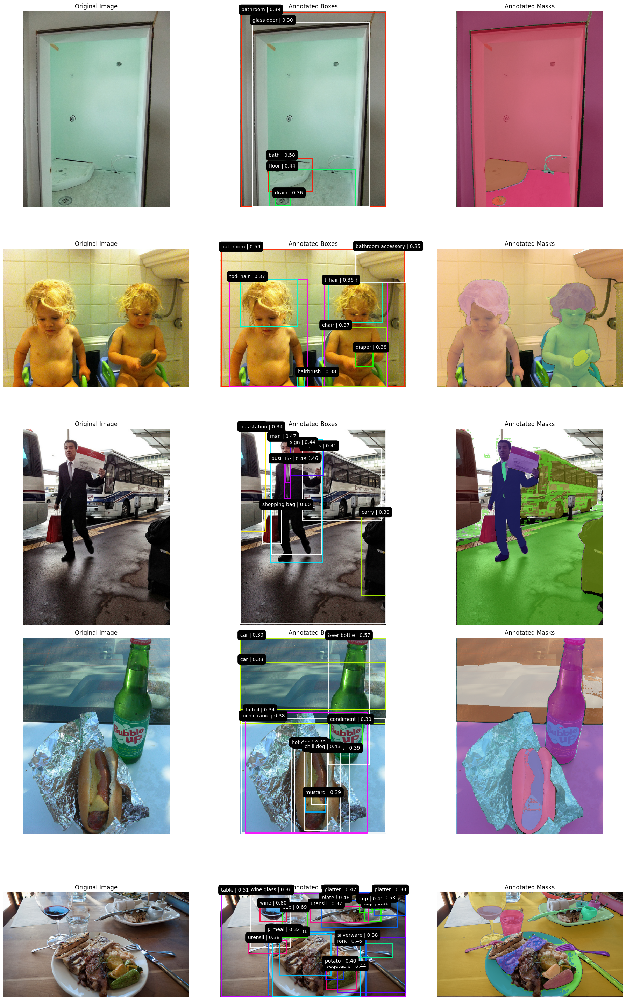

In [24]:
plot_annotations(df, image_col='filename', tags_col='ram_tags', bbox_col='grounding_dino_bboxes', scores_col='grounding_dino_scores', labels_col='grounding_dino_labels', masks_col='sam_masks')

## Convert Annotations to COCO Format

In [25]:
from fastdup.models_utils import convert_to_coco_format
convert_to_coco_format(df, bbox_col='grounding_dino_bboxes', label_col='grounding_dino_labels', json_filename='grounding_dino_annot_coco_format.json')

## Run fastdup

Now let's load the embeddings into fastdup and run an analysis to surface dataset issues.

In [26]:
import fastdup
fd = fastdup.create(input_dir="./")
fd.run(annotations="grounding_dino_annot_coco_format.json", overwrite=True)

FastDup Software, (C) copyright 2022 Dr. Amir Alush and Dr. Danny Bickson.
2023-10-17 17:07:50 [INFO] Going to loop over dir /tmp/tmpxoytlg1o.csv
2023-10-17 17:07:50 [INFO] Found total 91 images to run on, 91 train, 0 test, name list 91, counter 91 
FastDup Software, (C) copyright 2022 Dr. Amir Alush and Dr. Danny Bickson.utes
2023-10-17 17:07:52 [INFO] Going to loop over dir /tmp/crops_input.csv
2023-10-17 17:07:52 [INFO] Found total 90 images to run on, 90 train, 0 test, name list 90, counter 90 
2023-10-17 17:07:53 [INFO] Found total 90 images to run onEstimated: 0 Minutes
Finished histogram 0.030
Finished bucket sort 0.034
2023-10-17 17:07:53 [INFO] 10) Finished write_index() NN model
2023-10-17 17:07:53 [INFO] Stored nn model index file work_dir/nnf.index
2023-10-17 17:07:53 [INFO] Total time took 1018 ms
2023-10-17 17:07:53 [INFO] Found a total of 2 fully identical images (d>0.990), which are 1.11 % of total graph edges
2023-10-17 17:07:53 [INFO] Found a total of 8 nearly identic

0

## Visualize

You can use all of fastdup gallery methods to view duplicates, clusters, etc.

Let's view the image clusters.

drain


Generating gallery:   0%|          | 0/6 [00:00<?, ?it/s]

Finished OK. Components are stored as image files work_dir/galleries/components_[index].jpg
Stored components visual view in  work_dir/galleries/components.html
Execution time in seconds 0.1
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



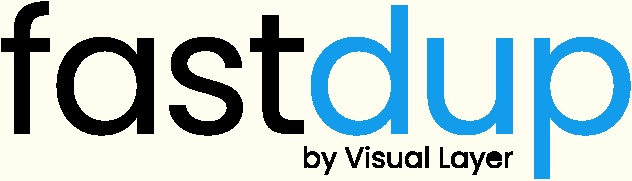
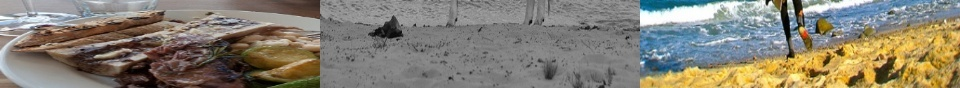
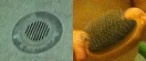
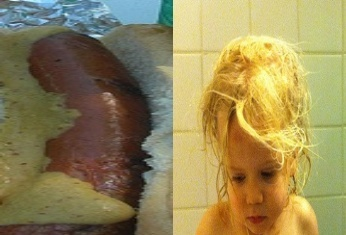
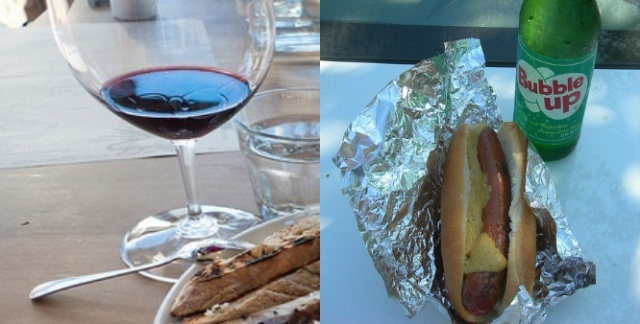
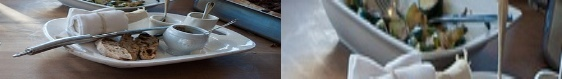
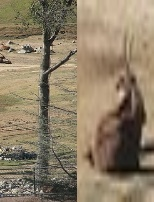

0

In [27]:
fd.vis.component_gallery()

And duplicates gallery.

Generating gallery:   0%|          | 0/20 [00:00<?, ?it/s]

Stored similarity visual view in  work_dir/galleries/duplicates.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



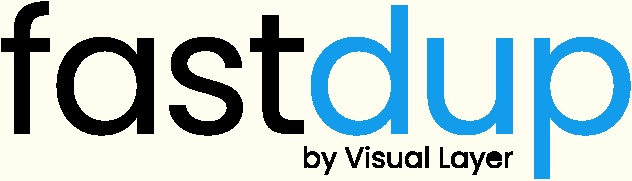
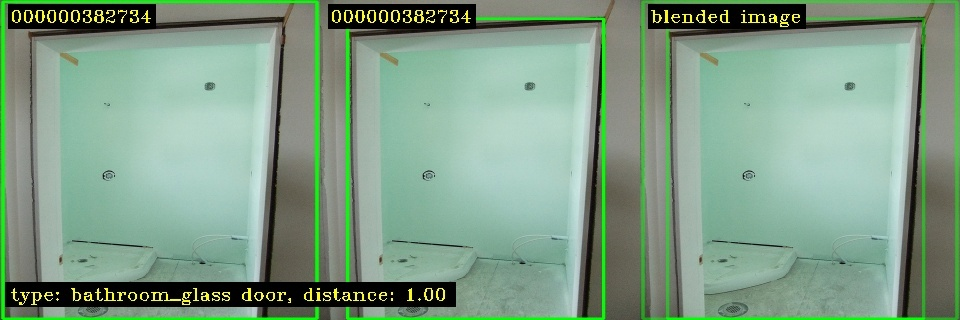
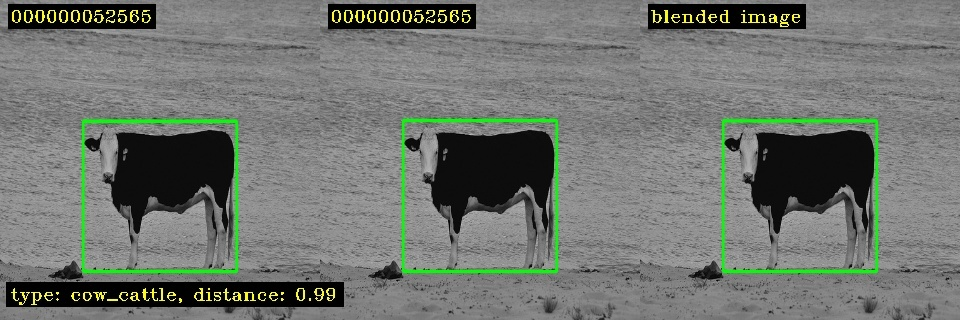
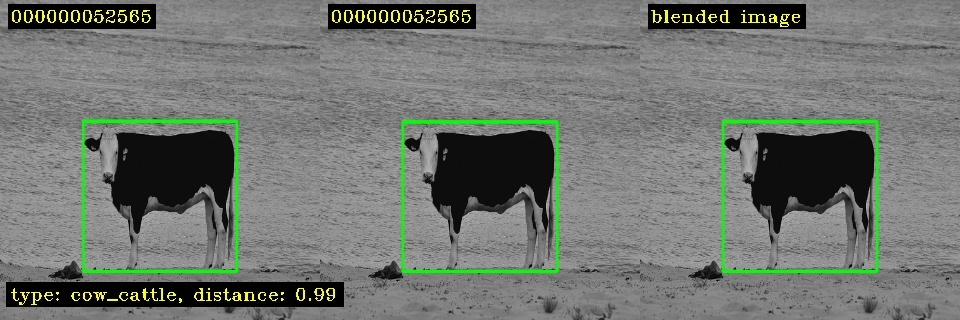
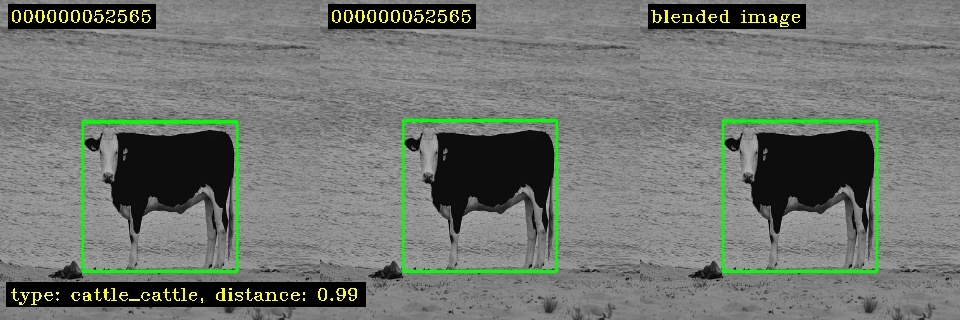
...
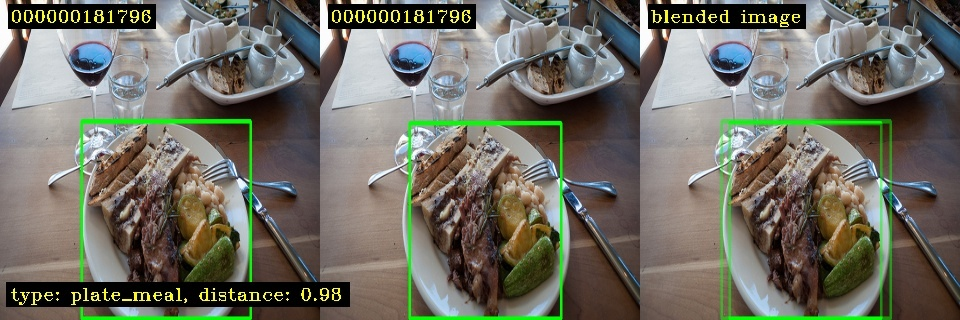
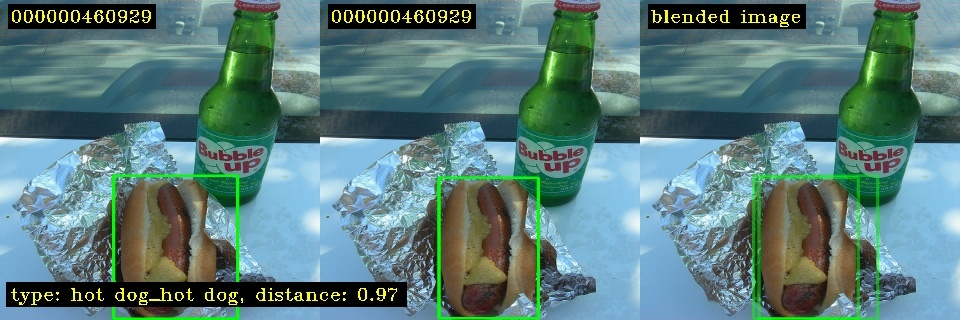
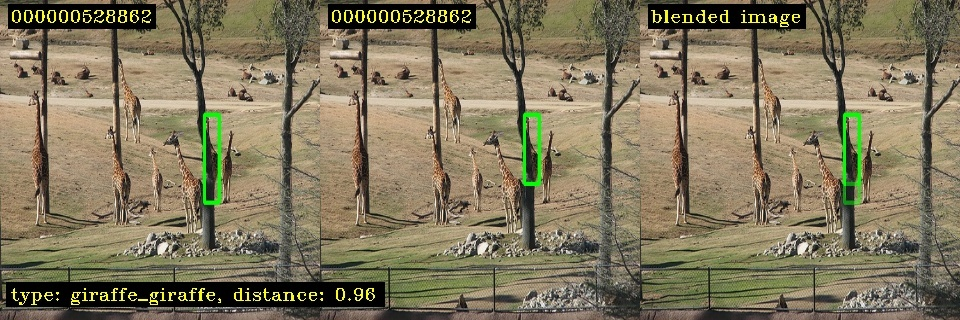
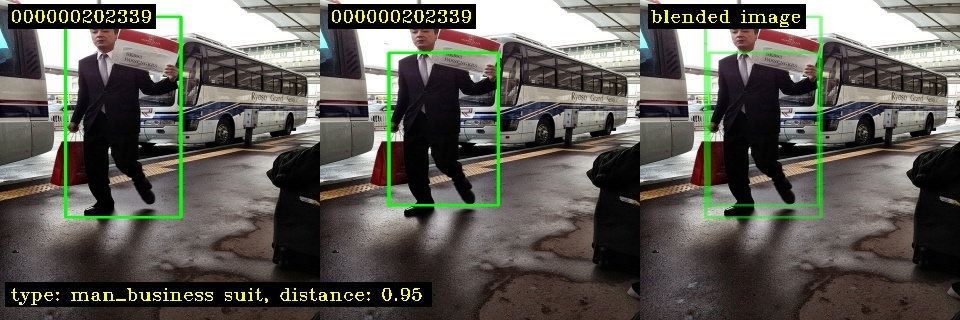
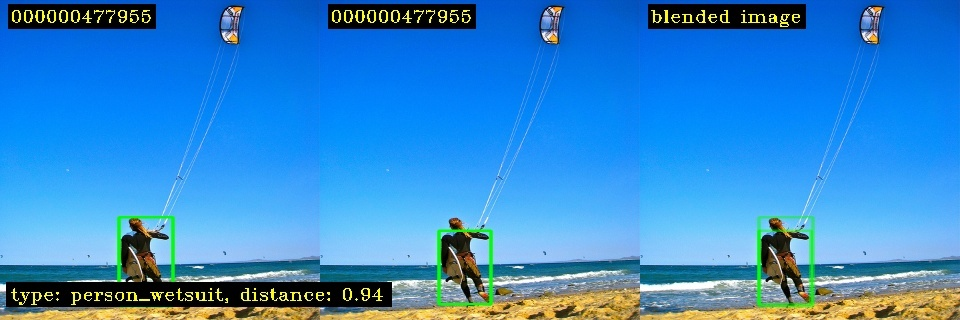

0

In [28]:
fd.vis.duplicates_gallery(draw_bbox=True)

## Wrap Up
In this tutorial, we showed how you can compute embeddings on your dataset using TIMM and run fastdup on top of it to surface dataset issues.

Questions about this tutorial? Reach out to us on our [Slack channel](https://visuallayer.slack.com/)!



Next, feel free to check out other tutorials -

+ ⚡ [**Quickstart**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/quick-dataset-analysis.ipynb): Learn how to install fastdup, load a dataset and analyze it for potential issues such as duplicates/near-duplicates, broken images, outliers, dark/bright/blurry images, and view visually similar image clusters. If you're new, start here!
+ 🧹 [**Clean Image Folder**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/cleaning-image-dataset.ipynb): Learn how to analyze and clean a folder of images from potential issues and export a list of problematic files for further action. If you have an unorganized folder of images, this is a good place to start.
+ 🖼 [**Analyze Image Classification Dataset**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/analyzing-image-classification-dataset.ipynb): Learn how to load a labeled image classification dataset and analyze for potential issues. If you have labeled ImageNet-style folder structure, have a go!
+ 🎁 [**Analyze Object Detection Dataset**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/analyzing-object-detection-dataset.ipynb): Learn how to load bounding box annotations for object detection and analyze for potential issues. If you have a COCO-style labeled object detection dataset, give this example a try.


## VL Profiler - A faster and easier way to diagnose and visualize dataset issues

If you prefer a no-code platform to inspect and visualize your dataset, [**try our free cloud product VL Profiler**](https://app.visual-layer.com) - VL Profiler is our first no-code commercial product that lets you visualize and inspect your dataset in your browser. 

VL Profiler is free to get started. Upload up to 1,000,000 images for analysis at zero cost!

[Sign up](https://app.visual-layer.com) now.

[![image](https://raw.githubusercontent.com/visual-layer/fastdup/main/gallery/github_banner_profiler.gif)](https://app.visual-layer.com)

As usual, feedback is welcome! Questions? Drop by our [Slack channel](https://visualdatabase.slack.com/join/shared_invite/zt-19jaydbjn-lNDEDkgvSI1QwbTXSY6dlA#/shared-invite/email) or open an issue on [GitHub](https://github.com/visual-layer/fastdup/issues).

<center> 
    <a href="https://www.visual-layer.com" target="_blank" rel="noopener noreferrer">
    <picture>
    <source media="(prefers-color-scheme: dark)" srcset="https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo_dark_mode.png" width=200>
    <source media="(prefers-color-scheme: light)" srcset="https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo.png" width=200>
    <img alt="vl logo." src="https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo.png" width=200>
    </picture>
    </a><br>
    <a href="https://github.com/visual-layer/fastdup" target="_blank" style="text-decoration: none;"> GitHub </a> •
    <a href="https://visual-layer.slack.com/" target="_blank" style="text-decoration: none;"> Join Slack Community </a> •
    <a href="https://visual-layer.readme.io/discuss" target="_blank" style="text-decoration: none;"> Discussion Forum </a>
</center>

<center> 
    <a href="https://medium.com/visual-layer" target="_blank" style="text-decoration: none;"> Blog </a> •
    <a href="https://visual-layer.readme.io/" target="_blank" style="text-decoration: none;"> Documentation </a> •
    <a href="https://visual-layer.com/about" target="_blank" style="text-decoration: none;"> About Us </a> 
</center>

<center> 
    <a href="https://www.linkedin.com/company/visual-layer/" target="_blank" style="text-decoration: none;"> LinkedIn </a> •
    <a href="https://twitter.com/visual_layer" target="_blank" style="text-decoration: none;"> Twitter </a>
</center>